In [19]:
import keras
import tensorflow as tf

In [1]:
import os
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from glob import glob
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
# training data
base_dir = Path(r'e:/Google Drive/research\projects/utica/model_save/1980/data_256/train')
mask_dir = base_dir.joinpath('80s_mask')
train_image_dir = mask_dir.joinpath('u_train_reproject')
trees_mask_dir = mask_dir.joinpath('trees')
building_mask_dir = mask_dir.joinpath('building')
pavement_mask_dir = mask_dir.joinpath('pavement')

In [3]:
I, N, M = 60, 256, 256

In [4]:
os.listdir(mask_dir)

['building', 'desktop.ini', 'pavement', 'trees', 'u_train_reproject']

In [5]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [6]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [7]:
def load_image(path: str) -> np.ndarray:
    rasts = gdal.Open(path, gdal.GA_ReadOnly)
    return rasts.GetRasterBand(1).ReadAsArray()[7:-7,5:-5]

def load_image_no_trim(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [8]:
def sorted_paths(img_dir: Path):
    return sorted(glob(img_dir.joinpath('*.tif').as_posix()), key=img_number)

In [9]:
def load_stack_nt(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image_no_trim(image_path)
    return stack

In [10]:
def load_stack_clip(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack
            

In [11]:
train_images = load_stack_clip((I, N, M), np.float32, train_image_dir, "wgs_train")
tree_masks = load_stack_clip((I, N, M), np.int8, trees_mask_dir, "tree_mask")
building_masks = load_stack_clip((I, N, M), np.int8, building_mask_dir, "building_mask")
pavement_masks = load_stack_clip((I, N, M), np.int8, pavement_mask_dir, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\trees\tree_mask_13.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\trees\tree_mask_22.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\trees\tree_mask_41.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\building\building_mask_1.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\building\building_mask_8.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\building\building_mask_24.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\building\building_mask_28.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\train\80s_mask\building\building_mask_36.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_2

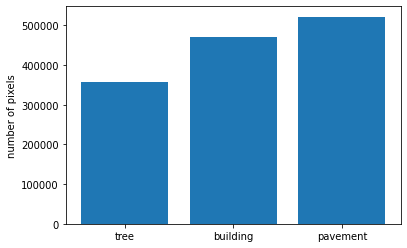

In [12]:
fig, ax = plt.subplots()
ax.bar(range(3), [tree_masks.sum(), building_masks.sum(), pavement_masks.sum()])
ax.set_xticks((0, 1, 2))
ax.set_xticklabels(('tree', 'building', 'pavement'))
plt.ylabel('number of pixels')
plt.show()

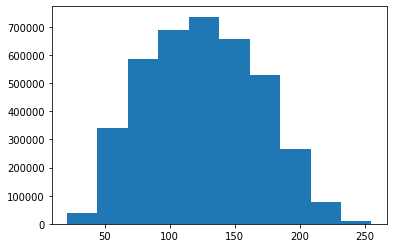

In [13]:
plt.hist(train_images.flatten())
plt.show()

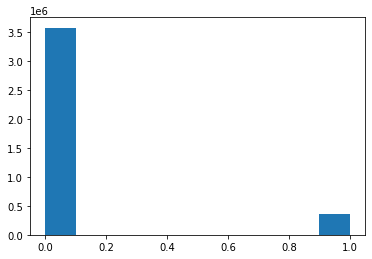

In [14]:
plt.hist(tree_masks.flatten())
plt.show()

In [20]:
# alter unet code from package
from keras_unet import TF
if TF:
    from tensorflow.keras.models import Model
    from tensorflow.keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )
else:    
    from keras.models import Model
    from keras.layers import ( 
        BatchNormalization, Conv2D, Conv2DTranspose,
        MaxPooling2D, UpSampling2D, Input,
        concatenate
    )


def bn_conv_relu(input, filters, bachnorm_momentum, **conv2d_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2D(filters, **conv2d_args)(x)
    return x

def bn_upconv_relu(input, filters, bachnorm_momentum, **conv2d_trans_args):
    x = BatchNormalization(momentum=bachnorm_momentum)(input)
    x = Conv2DTranspose(filters, **conv2d_trans_args)(x)
    return x

def satellite_unet2(
    input_shape,
    num_classes=1,
    output_activation='sigmoid',
    num_layers=4):

    inputs = Input(input_shape)   
    
    filters = 64
    upconv_filters = 96

    kernel_size = (5,5)
    activation = 'relu'
    strides = (1,1)
    padding = 'same'
    kernel_initializer = 'he_normal'

    conv2d_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':strides,
        'padding':padding,
        'kernel_initializer':kernel_initializer
        }

    conv2d_trans_args = {
        'kernel_size':kernel_size,
        'activation':activation, 
        'strides':(2,2),
        'padding':padding,
        'output_padding':(1,1)
        }

    bachnorm_momentum = 0.01

    pool_size = (2,2)
    pool_strides = (2,2)
    pool_padding = 'valid'

    maxpool2d_args = {
        'pool_size':pool_size,
        'strides':pool_strides,
        'padding':pool_padding,
        }
    
    x = Conv2D(filters, **conv2d_args)(inputs)
    c1 = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)    
    x = bn_conv_relu(c1, filters, bachnorm_momentum, **conv2d_args)
    x = MaxPooling2D(**maxpool2d_args)(x)

    down_layers = []

    for l in range(num_layers):
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        down_layers.append(x)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = MaxPooling2D(**maxpool2d_args)(x)

    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
    x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    for conv in reversed(down_layers):        
        x = concatenate([x, conv])  
        x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
        x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
        x = bn_upconv_relu(x, filters, bachnorm_momentum, **conv2d_trans_args)

    x = concatenate([x, c1])
    x = bn_conv_relu(x, upconv_filters, bachnorm_momentum, **conv2d_args)
    x = bn_conv_relu(x, filters, bachnorm_momentum, **conv2d_args)
           
    outputs = Conv2D(num_classes, kernel_size=(1,1), strides=(1,1), activation=output_activation, padding='valid') (x)       
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [21]:
model = satellite_unet2(
    (N, M, 1),
    3,
    # dropout_type="spatial"
)

In [22]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(), 
    #optimizer=SGD(lr=0.01, momentum=0.99),
    loss='binary_crossentropy',
    #loss=jaccard_distance,
    metrics=[iou, iou_thresholded],
    
)

In [23]:
Y = np.zeros(shape=(I, N, M, 3), dtype=np.int8)
Y[:, :, :, 0] = tree_masks
Y[:, :, :, 1] = building_masks
Y[:, :, :, 2] = pavement_masks

In [24]:
Y.shape, tree_masks.shape

((60, 256, 256, 3), (60, 256, 256))

In [25]:
history = model.fit(
    train_images.reshape(I, N, M, 1),
    Y,
    epochs=150,
)

Epoch 1/150
2/2 [==============================] - 65s 28s/step - loss: 0.9114 - iou: 0.1125 - iou_thresholded: 0.1194
Epoch 2/150
2/2 [==============================] - 61s 29s/step - loss: 0.4341 - iou: 0.1007 - iou_thresholded: 0.0750
Epoch 3/150
2/2 [==============================] - 63s 29s/step - loss: 0.3556 - iou: 0.0990 - iou_thresholded: 0.0340
Epoch 4/150
2/2 [==============================] - 60s 28s/step - loss: 0.3370 - iou: 0.1270 - iou_thresholded: 0.0772
Epoch 5/150
2/2 [==============================] - 60s 28s/step - loss: 0.3183 - iou: 0.1302 - iou_thresholded: 0.0665
Epoch 6/150
2/2 [==============================] - 60s 28s/step - loss: 0.3062 - iou: 0.1483 - iou_thresholded: 0.1072
Epoch 7/150
2/2 [==============================] - 61s 29s/step - loss: 0.2989 - iou: 0.1510 - iou_thresholded: 0.1144
Epoch 8/150
2/2 [==============================] - 61s 29s/step - loss: 0.2913 - iou: 0.1528 - iou_thresholded: 0.1209
Epoch 9/150
2/2 [==============================]

2/2 [==============================] - 61s 28s/step - loss: 0.1185 - iou: 0.5323 - iou_thresholded: 0.6169
Epoch 70/150
2/2 [==============================] - 60s 28s/step - loss: 0.1069 - iou: 0.5605 - iou_thresholded: 0.6594
Epoch 71/150
2/2 [==============================] - 61s 28s/step - loss: 0.1122 - iou: 0.5484 - iou_thresholded: 0.6519
Epoch 72/150
2/2 [==============================] - 60s 28s/step - loss: 0.1162 - iou: 0.5450 - iou_thresholded: 0.6317
Epoch 73/150
2/2 [==============================] - 60s 28s/step - loss: 0.1058 - iou: 0.5680 - iou_thresholded: 0.6676
Epoch 74/150
2/2 [==============================] - 60s 28s/step - loss: 0.1080 - iou: 0.5659 - iou_thresholded: 0.6701
Epoch 75/150
2/2 [==============================] - 60s 28s/step - loss: 0.1012 - iou: 0.5744 - iou_thresholded: 0.6845
Epoch 76/150
2/2 [==============================] - 60s 28s/step - loss: 0.1069 - iou: 0.5638 - iou_thresholded: 0.6632
Epoch 77/150
2/2 [==============================] - 6

2/2 [==============================] - 59s 28s/step - loss: 0.0772 - iou: 0.7143 - iou_thresholded: 0.7768
Epoch 138/150
2/2 [==============================] - 59s 27s/step - loss: 0.0667 - iou: 0.7072 - iou_thresholded: 0.7826
Epoch 139/150
2/2 [==============================] - 59s 27s/step - loss: 0.0736 - iou: 0.6911 - iou_thresholded: 0.7590
Epoch 140/150
2/2 [==============================] - 59s 27s/step - loss: 0.0690 - iou: 0.6983 - iou_thresholded: 0.7774
Epoch 141/150
2/2 [==============================] - 59s 28s/step - loss: 0.0726 - iou: 0.6906 - iou_thresholded: 0.7702
Epoch 142/150
2/2 [==============================] - 59s 27s/step - loss: 0.0689 - iou: 0.6894 - iou_thresholded: 0.7728
Epoch 143/150
2/2 [==============================] - 59s 28s/step - loss: 0.0661 - iou: 0.6970 - iou_thresholded: 0.7815
Epoch 144/150
2/2 [==============================] - 60s 28s/step - loss: 0.0666 - iou: 0.7043 - iou_thresholded: 0.7882
Epoch 145/150
2/2 [===========================

In [26]:

modelsave_path = Path(r'e:\Google Drive\research\projects\utica\model_save\1980\model_kernal\saved_modelkernal')

In [27]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: e:\Google Drive\research\projects\utica\model_save\1980\model_kernal\saved_modelkernal\assets


In [28]:
Y_pred = model.predict(train_images.reshape(I, N, M, 1))

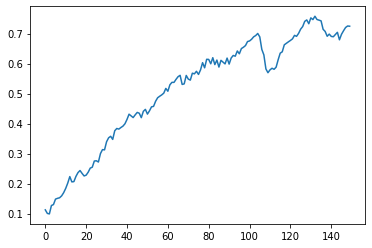

In [29]:
plt.plot(history.history['iou'])

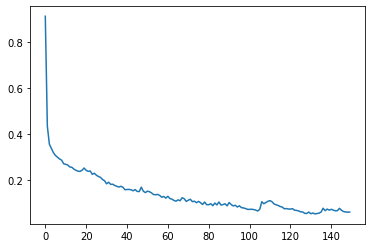

In [30]:
plt.plot(history.history['loss'])

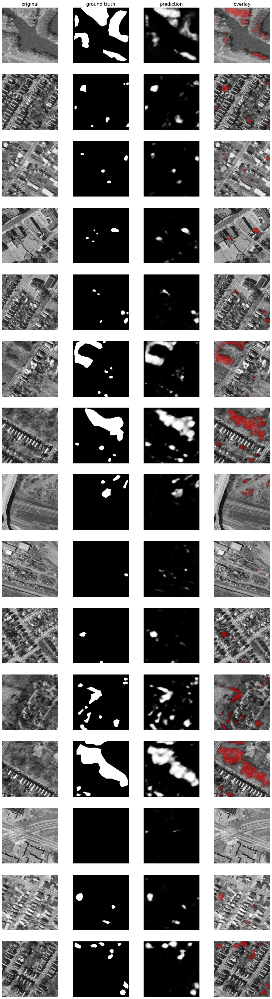

In [31]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=15
  )

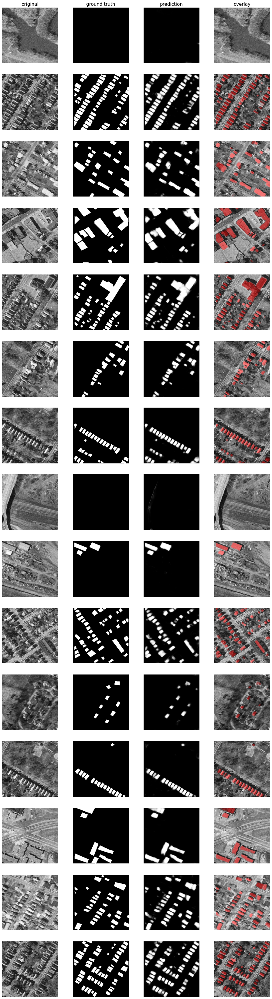

In [32]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=15
  )

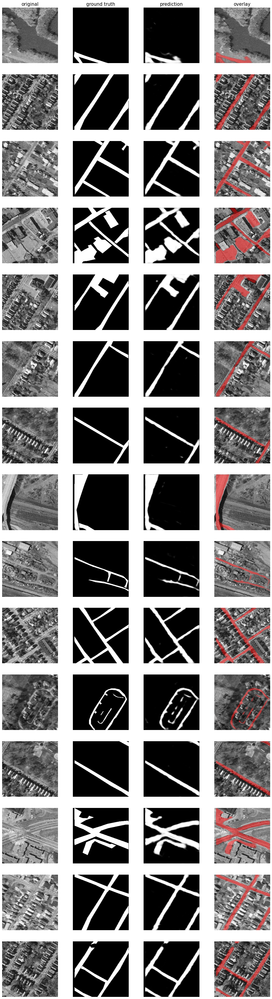

In [33]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(I, N, M, 1), 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [34]:
# validation data
base_dirV = Path(r'e:/Google Drive/research/projects/utica/model_save/1980/data_256/valid')
mask_dirV = base_dirV.joinpath('mask_80s_valid')
train_image_dirV = mask_dirV.joinpath('u_valid_reproject')
trees_mask_dirV = mask_dirV.joinpath('trees')
building_mask_dirV = mask_dirV.joinpath('building')
pavement_mask_dirV = mask_dirV.joinpath('pavement')

In [35]:
K, N, M = 20, 256, 256

In [36]:
valid_images = load_stack_clip((K, N, M), np.float32, train_image_dirV, "wgs_valid")
tree_valid = load_stack_clip((K, N, M), np.int8, trees_mask_dirV, "tree_mask")
building_valid = load_stack_clip((K, N, M), np.int8, building_mask_dirV, "building_mask")
pavement_valid = load_stack_clip((K, N, M), np.int8, pavement_mask_dirV, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\valid\mask_80s_valid\trees\tree_mask_4.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\valid\mask_80s_valid\building\building_mask_4.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\valid\mask_80s_valid\building\building_mask_10.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\valid\mask_80s_valid\building\building_mask_16.tif
skipping e:\Google Drive\research\projects\utica\model_save\1980\data_256\valid\mask_80s_valid\pavement\pavement_mask_16.tif


In [37]:
Yvalid = np.zeros(shape=(K, N, M, 3), dtype=np.int8)
Yvalid[:, :, :, 0] = tree_valid
Yvalid[:, :, :, 1] = building_valid
Yvalid[:, :, :, 2] = pavement_valid

In [38]:
Y_valid = model.predict(valid_images.reshape(K, N, M, 1))

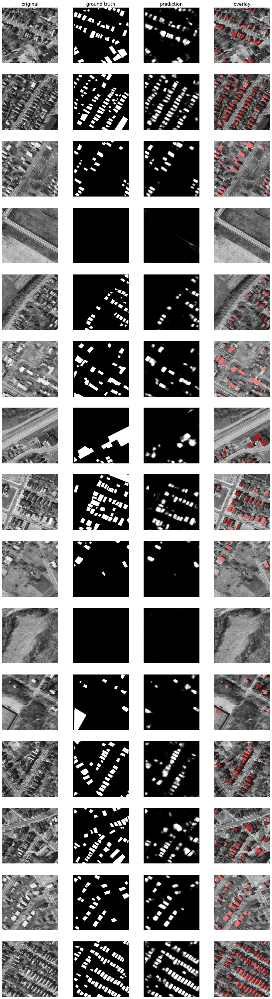

In [39]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 1], 
    pred_imgs=Y_valid[:, :, :, 1], 
    nm_img_to_plot=15
  )

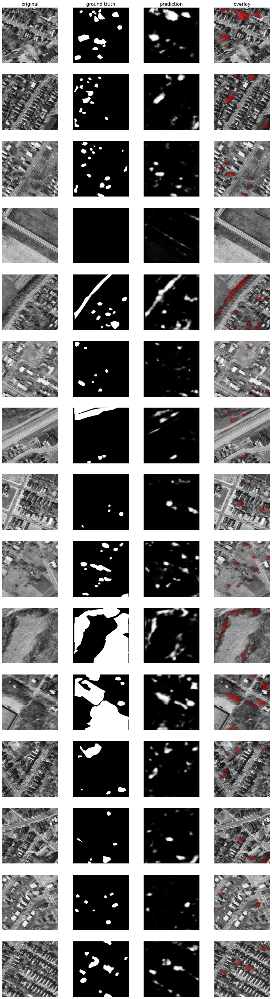

In [40]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 0], 
    pred_imgs=Y_valid[:, :, :, 0], 
    nm_img_to_plot=15
  )

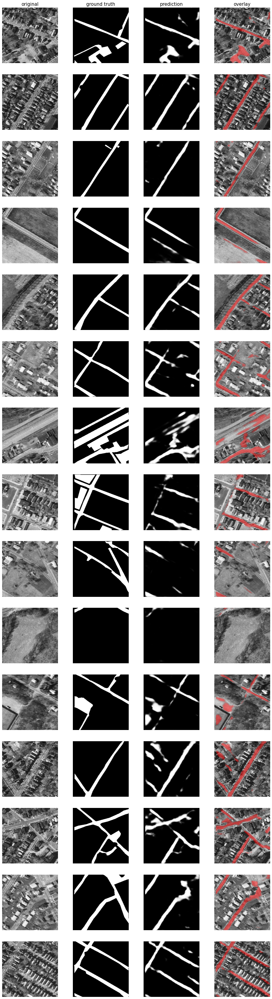

In [41]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 1), 
    mask_imgs=Yvalid[:, :, :, 2], 
    pred_imgs=Y_valid[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [42]:
Y_valid[0,0,0,0]

0.060888708

In [43]:
treePredict = Y_valid[:,:,:,0]

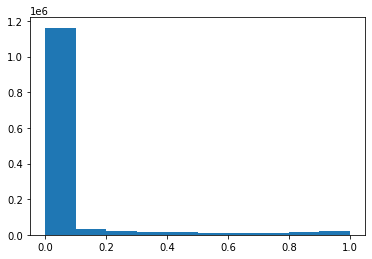

In [44]:
plt.hist(treePredict.flatten())
plt.show()

In [45]:
# prediction data
base_dirP = Path(r'E:/Google Drive/research/projects/utica/model_save/1980/img_tile_256/image')

In [46]:
J, N, M = 627, 256, 256

In [47]:
predict_img = load_stack_nt((J, N, M), np.float32,base_dirP, "predict")

In [48]:
Y_all = model.predict(predict_img.reshape(J, N, M, 1))

In [57]:
Y_all.shape

(627, 256, 256, 3)

In [49]:
# prediction data offset 2 (25 pixels)
base_dirP2 = Path(r'e:/Google Drive/research/projects/utica/model_save/1980/img_tile_256/image_2')
predict_img2 = load_stack_nt((J, N, M), np.float32,base_dirP2, "predict")

In [50]:
Y_all2 = model.predict(predict_img2.reshape(J, N, M, 1))

In [51]:
Y_all2.shape

(627, 256, 256, 3)

In [52]:
# prediction data offset 3 (100 pixels)
L, N, M = 576, 256, 256
base_dirP3 = Path(r'e:/Google Drive/research/projects/utica/model_save/1980/img_tile_256/image_3')
predict_img3 = load_stack_nt((L, N, M), np.float32,base_dirP3, "predict")

In [53]:
Y_all3 = model.predict(predict_img3.reshape(L, N, M, 1))
Y_all3.shape

(576, 256, 256, 3)

In [54]:
driver = gdal.GetDriverByName("GTiff")

In [55]:
driver.Register()

2

In [56]:
def load_stack_nt(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image_no_trim(image_path)
    return stack

In [57]:
def save_predict_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(Y_valid[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [58]:
tree_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/1980/prediction_kernal/valid/trees'
save_predict_valid(nImg = 20,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [59]:
def save_predict_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outBuild = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outBuild.SetGeoTransform(gt)
        outBuild.SetProjection(pt)
        outBandBuild = outBuild.GetRasterBand(1)
        outBandBuild.WriteArray(Y_valid[i,:,:,1])
        outBandBuild.SetNoDataValue(np.nan)
        outBandBuild.FlushCache()
        outBandBuild = None
        outBuild = None

In [60]:
build_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/1980/prediction_kernal/valid/building'
save_predict_validB(nImg = 20,xdim= 256, ydim= 256,img_dir =build_valid_dir,prefix = "building_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [61]:
def save_predict_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outPave = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outPave.SetGeoTransform(gt)
        outPave.SetProjection(pt)
        outBandPave = outPave.GetRasterBand(1)
        outBandPave.WriteArray(Y_valid[i,:,:,2])
        outBandPave.SetNoDataValue(np.nan)
        outBandPave.FlushCache()
        outBandPave = None
        outPave = None

In [62]:
pave_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/1980/prediction_kernal/valid/pavement'
save_predict_validP(nImg = 20,xdim= 256, ydim= 256,img_dir =pave_valid_dir,prefix = "pavement_predict",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [63]:
#due to late night coding, mask files where slightly off dimensions. Need to resave files that were cut down here for easier matching.
def save_mask_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [64]:
tree_m_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/valid/crop_valid/tree'
save_mask_valid(nImg = 20,xdim= 256, ydim= 256,img_dir = tree_m_dir, prefix = "tree_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [65]:
def save_mask_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [66]:
build_m_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/valid/crop_valid/building'
save_mask_validB(nImg = 20,xdim= 256, ydim= 256,img_dir = build_m_dir, prefix = "building_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [68]:
def save_mask_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [69]:
pave_m_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/valid/crop_valid/pavement'
save_mask_validP(nImg = 20,xdim= 256, ydim= 256,img_dir = pave_m_dir, prefix = "pavement_mask",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [70]:
def save_mask_image( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(valid_images[i, :, :])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [71]:
image_m_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/valid/crop_valid/image'
save_mask_image(nImg = 20,xdim= 256, ydim= 256,img_dir = image_m_dir, prefix = "image",orig_dir = train_image_dirV , prefix_orig = "wgs_valid")

In [72]:
valid_images.shape

(20, 256, 256)

In [73]:
train_image_dirV

WindowsPath('e:/Google Drive/research/projects/utica/model_save/1980/data_256/valid/mask_80s_valid/u_valid_reproject')

In [74]:
# save map prediction

def save_predict_build( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None


In [75]:
predict_build_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image/building'
save_predict_build(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_build_dir, prefix = "building",orig_dir = base_dirP , prefix_orig = "predict")

In [76]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [77]:
predict_tree_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image/tree'
save_predict_tree(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_tree_dir, prefix = "tree",orig_dir = base_dirP , prefix_orig = "predict")

In [78]:
def save_predict_pave( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [79]:
predict_pave_dir = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image/pavement'
save_predict_pave(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_pave_dir, prefix = "pavement",orig_dir = base_dirP , prefix_orig = "predict")

In [80]:

# save map prediction

def save_predict_build2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [81]:
predict_build_dir2 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_2/building'
save_predict_build2(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_build_dir2, prefix = "building",orig_dir = base_dirP2 , prefix_orig = "predict")

In [82]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [83]:
predict_tree_dir2 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_2/tree'
save_predict_tree2(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_tree_dir2, prefix = "tree",orig_dir = base_dirP2 , prefix_orig = "predict")

In [84]:
def save_predict_pave2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [85]:

predict_pave_dir2 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_2/pavement'
save_predict_pave(nImg = 627,xdim= 256, ydim= 256,img_dir = predict_pave_dir2, prefix = "pavement",orig_dir = base_dirP2 , prefix_orig = "predict")

In [86]:
def save_predict_build3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [87]:
predict_build_dir3 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_3/building'
save_predict_build3(nImg = 576,xdim= 256, ydim= 256,img_dir = predict_build_dir3, prefix = "building",orig_dir = base_dirP3 , prefix_orig = "predict")

In [88]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [89]:
predict_tree_dir3 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_3/tree'
save_predict_tree3(nImg = 576,xdim= 256, ydim= 256,img_dir = predict_tree_dir3, prefix = "tree",orig_dir = base_dirP3 , prefix_orig = "predict")

In [90]:
def save_predict_pave3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [91]:
predict_pave_dir3 = r'e:/Google Drive/research/projects/utica/model_save/1980/prediction_kernal/image_3/pavement'
save_predict_pave(nImg = 576,xdim= 256, ydim= 256,img_dir = predict_pave_dir3, prefix = "pavement",orig_dir = base_dirP3 , prefix_orig = "predict")